<a href="https://colab.research.google.com/github/Andresssg/Tesis/blob/main/Counting/Gaitan/Test2_Gaitan_pt2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [5]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [6]:
!pip install ultralytics==8.0.84
!pip install supervision==0.4.0
!pip install moviepy
!pip install mysql-connector-python
!apt install ffmpeg

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 529.8/529.8 kB 9.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 201.7/201.7 kB 23.2 MB/s eta 0:00:00
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 27.4/27.4 MB 52.5 MB/s eta 0:00:00
Reading package lists... Done
Building dependency tree       
Reading state information... Done
ffmpeg is already the newest version (7:4.2.7-0ubuntu0.1).
0 upgraded, 0 newly installed, 0 to remove and 24 not upgraded.


In [7]:
import os
import cv2
from ultralytics import YOLO
import supervision as sv


In [8]:
video_name = 'parqueGaitan_pt2.mov'
nombre_parque = 'Gaitan Cortes'
#Copiar files
#!cp '/content/drive/MyDrive/Proyecto de grado (Conteo personas)/Dataset/metrics/100epoch_clean/detect/train/weights/best.pt' /content
!cp '/content/drive/MyDrive/Proyecto de grado (Conteo personas)/Videos/'{video_name} /content
!cp '/content/drive/MyDrive/Proyecto de grado (Conteo personas)/Scripts/envDB.txt' /content

In [9]:
video_path = f"/content/{video_name}"
model_path = "/content/best.pt"
video_path_out = f"/content/out_{video_name}"
light_video_path = f"/content/light_{video_name}"

In [10]:
#Cargar modelo 
#model = YOLO(model_path)
model = YOLO("yolov8n.pt")
#results = model.track(source=video_path, tracker="botsort.yaml", save=True, conf=0.5)

100%|██████████| 6.23M/6.23M [00:00<00:00, 33.0MB/s]


In [11]:
import os
from IPython.display import display, Image

cap = cv2.VideoCapture(video_path)

ret, frame = cap.read()
H, W, _ = frame.shape
total_frame = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))

out = cv2.VideoWriter(video_path_out, cv2.VideoWriter_fourcc(*'XVID'), int(cap.get(cv2.CAP_PROP_FPS)), (W, H))


In [12]:

#Se definen los estilos de la caja
box_annotator = sv.BoxAnnotator(
    thickness=2,
    text_thickness=1,
    text_scale=0.5
)

#Se definen los puntos donde ve va a ubicar la linea

#video atenas mal
#START = sv.Point(0, H/1.8)
#END = sv.Point(W, H/1.8)

#video atenas
#START = sv.Point(W/1.65, H)
#END = sv.Point(W/1.65, 0)

#video atenaspt2
#START = sv.Point(W/1.82, H)
#END = sv.Point(W/1.82, 0)

#video gaitan cortes
START = sv.Point(W/2.4, H)
END = sv.Point(W/2.4, 0)

#Se definen los estilos de la linea y se colocan los puntos inicial y final
line_zone = sv.LineZone(start=START, end=END)

line_zone_annotator = sv.LineZoneAnnotator(
    thickness=2,
    text_thickness=1,
    text_scale=0.5,
)

frame_count = 0
last_printed = -1

#Se itera cada frame del video
for result in model.track(source=video_path, stream=True, verbose=False, save=True):
    percentage = round(frame_count / total_frame * 100)
    if percentage % 1 == 0 and percentage != last_printed:
        print(f"{percentage}%")
        last_printed = percentage

    #Se obtiene el frame
    frame = result.orig_img
    #Se obtienen las coordenadas y toda la informacion asociada a la deteccion
    detections = sv.Detections.from_yolov8(result)
    
    if result.boxes.id is not None:
        detections.tracker_id = result.boxes.id.cpu().numpy().astype(int)

    detections = detections[detections.class_id == 0]
    labels = [
        f"{tracker_id} {model.model.names[class_id]} {confidence:0.2f}"
        for _, confidence, class_id, tracker_id
        in detections
    ]

    frame = box_annotator.annotate(scene=frame, detections=detections, labels=labels)
    
    line_zone.trigger(detections=detections)
    line_zone_annotator.annotate(frame=frame, line_counter=line_zone)

    out.write(frame)

    frame_count += 1
    #if frame_count >= 50:
        #break
        

print(line_zone.in_count)
print(line_zone.out_count)

out.release()
cap.release()

requirements: YOLOv8 requirement "lap>=0.4" not found, attempting AutoUpdate...
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5 MB 19.2 MB/s eta 0:00:00
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
  Created wheel for lap: filename=lap-0.4.0-cp310-cp310-linux_x86_64.whl size=1655271 sha256=b6aeb235f5c774c2b9427a59002484718ef28f7ef7569bf52c804bf6b90bec88
  Stored in directory: /tmp/pip-ephem-wheel-cache-qn_sw9a0/wheels/00/42/2e/9dfe19270eea279d79e84767ff0d7b8082c3bf776cad00e83d
Successfully built lap

requirements: 1 package updated per ['lap>=0.4']
requirements: ⚠️ Restart runtime or rerun command for updates to take effect



0%
1%
2%
3%
4%
5%
6%
7%
8%
9%
10%
11%
12%
13%
14%
15%
16%
17%
18%
19%
20%
21%
22%
23%
24%
25%
26%
27%
28%
29%
30%
31%
32%
33%
34%
35%
36%
37%
38%
39%
40%
41%
42%
43%
44%
45%
46%
47%
48%
49%
50%
51%
52%
53%
54%
55%
56%
57%
58%
59%
60%
61%
62%
63%
64%
65%
66%
67%
68%
69%
70%
71%
72%
73%
74%
75%
76%
77%
78%
79%
80%
81%
82%
83%
84%
85%
86%
87%
88%
89%
90%
91%
92%
93%
94%
95%
96%
97%
98%
99%
100%


Results saved to runs/detect/track


10
15


In [ ]:
#!ffmpeg -y -i {video_path_out} {light_video_path}

MoviePy - Building file /content/video.gif with imageio.


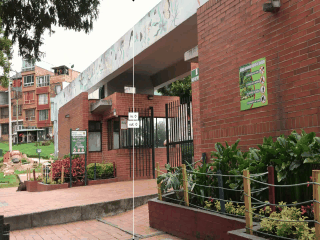

In [13]:
from moviepy.editor import *

# Cargar el archivo de video MP4

video = VideoFileClip(video_path_out)

# Obtener la duración del video y establecer la duración del GIF
duration = video.duration
gif_duration = min(10, duration) # Duración del GIF: 10 segundos o la duración del video si es menor a 10 segundos

# Crear el archivo de animación GIF
gif_path = "/content/video.gif"
video.subclip(0, gif_duration).resize((320, 240)).write_gif(gif_path, fps=15)

# Mostrar el archivo de animación GIF en el cuaderno
from IPython.display import Image
Image(open(gif_path, 'rb').read())

In [14]:
#Leer credenciales DB
credentials = []
with open('/content/envDB.txt') as env:
  for line in env:
    credentials.append(line.strip())

In [15]:
#Conexion DB
import mysql.connector

db = mysql.connector.connect(
    host=credentials[0],
    user=credentials[1],
    password=credentials[2],
    database=credentials[3]
)

In [16]:
#Insertar datos a la tabla de conteo de personas

cursor = db.cursor()
query = "INSERT INTO conteos (ingreso_personas, salida_personas) VALUES (%s, %s);"
values = (line_zone.in_count, line_zone.out_count)
cursor.execute(query,values)

db.commit()

In [17]:
import datetime
import pytz

# Obtén la fecha y hora actual
fecha_actual = datetime.datetime.now()
zona_horaria_utc = pytz.timezone('UTC')
fecha_actual_utc = zona_horaria_utc.localize(fecha_actual)

# Establece la zona horaria de Colombia
zona_horaria_colombia = pytz.timezone('America/Bogota')
fecha_actual_colombia = fecha_actual_utc.astimezone(zona_horaria_colombia)
format_fecha_colombia = str(fecha_actual_colombia.strftime('%Y-%m-%d %H:%M:%S'))
print(format_fecha_colombia)

2023-05-01 19:17:52


In [18]:
#Insertar datos en la tabla reportes

queryReportes = "INSERT INTO REPORTES VALUES (null, (SELECT last_insert_id()), %s, %s)"
values = (format_fecha_colombia, nombre_parque)
cursor.execute(queryReportes, values)

db.commit()

In [19]:
#Imprimir tabla con pandas y plotly
import pandas as pd
import plotly.graph_objects as go
from plotly.subplots import make_subplots


query = """
SELECT reportes.id_reportes, reportes.id_conteo_personas, reportes.fecha_hora, reportes.parque, conteos.ingreso_personas, conteos.salida_personas
FROM reportes 
INNER JOIN conteos 
ON reportes.id_conteo_personas = conteos.id_conteo;
"""
df = pd.read_sql(query, con=db)

# Crear tabla utilizando plotly
fig = go.Figure(data=[go.Table(
    header=dict(values=list(df.columns),
                fill_color='gray',
                align='left'),
    cells=dict(values=[df[column] for column in df.columns],
               fill_color='white',
               align='left'))
])

# Configurar diseño de la tabla
fig.update_layout(width=800, height=500)

# Mostrar tabla en Colab
fig.show()

  df = pd.read_sql(query, con=db)



In [20]:
#Enviar a drive
!cp {video_path_out} '/content/drive/MyDrive/Proyecto de grado (Conteo personas)/Output_Videos/'
#!cp {light_video_path} '/content/drive/MyDrive/Proyecto de grado (Conteo personas)/Videos/'
#!cp '/content/runs/detect/track19/parqueTest.mp4'  '/content/drive/MyDrive/Proyecto de grado (Conteo personas)/Videos/out2_'{video_name}

In [ ]:
import shutil
#os.remove(video_path_out)
#shutil.rmtree('/content/runs')